In [1]:
#Import all the libraries
import pandas as pds
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import rcParams
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')


In [2]:

import re
import nltk
import string
import nlp_utils
import collections
import contractions
import nlp_utils as nu
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer

In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [4]:
with open('TextAnalytics.txt','r') as f:
    df = f.read()

df

'0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you\'ll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to th

In [5]:
df = df.split('\n')


Tokenization

In [6]:
corpus = [df]
for i in df:
    corpus.append(i.split('\t'))
    

In [7]:
letters = re.sub(r'[^a-zA-Z]'," ",str(corpus))

In [8]:
letters = letters.lower()
token = nltk.sent_tokenize(letters)
token

['      one of the other reviewers has mentioned that after watching just   oz episode you  ll be hooked  they are right  as this is exactly what happened with me  br    br   the first thing that struck me about oz was its brutality and unflinching scenes of violence  which set in right from the word go  trust me  this is not a show for the faint hearted or timid  this show pulls no punches with regards to drugs  sex or violence  its is hardcore  in the classic use of the word  br    br   it is called oz as that is the nickname given to the oswald maximum security state penitentary  it focuses mainly on emerald city  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  em city is home to many  aryans  muslims  gangstas  latinos  christians  italians  irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   i would say the main appeal of the show is due t

In [9]:
def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

def clean_nda(token):
    tokens = tokens = token.split()
    map_list = list(map(num_dec_al,tokens))
    return " ".join(map_list)

corpus_nda = list(map(clean_nda,token))

corpus_nda

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t d

In [10]:
# corpus_nda with expanded contractions and converted to lowercase.
data = [corpus_nda]
for sent in df:
    data.append(sent.split('\t'))
    

In [11]:
data.append(sent.split('\n'))

In [12]:
data

[['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t 

In [13]:
txtdf = pds.DataFrame(data)
txtdf

,0,1,2,3,4,5,6
0,one of the other reviewers has mentioned that ...,None,None,None,None,None,None
1,"0,""One of the other reviewers has mentioned th...",None,None,None,None,None,None
2,"1,""A wonderful little production. <br /><br />...",None,None,None,None,None,None
3,"2,""I thought this was a wonderful way to spend...",None,None,None,None,None,None
4,"3,""Basically there's a family where a little b...",None,None,None,None,None,None
...,...,...,...,...,...,...,...
997,"996,""I hated it. I hate self-aware pretentious...",None,None,None,None,None,None
998,"997,""I usually try to be professional and cons...",None,None,None,None,None,None
999,"998,""If you like me is going to see this in a ...",None,None,None,None,None,None
1000,"999,""This is like a zoology textbook, given th...",None,None,None,None,None,None


In [14]:
txtdf.drop([1,2,3,4,5,6],axis=1,inplace=True)
txtdf

,0
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


In [15]:
#final dataset
txtdf= txtdf.rename(columns={0: 'Text'})
txtdf

,Text
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


In [16]:
#dropping rows 1 and 1000 as they are repeated
txtdf.drop(txtdf.index[:1], inplace=True)

In [17]:
txtdf.drop(txtdf.index[1000:], inplace=True)
txtdf

,Text
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
5,"4,""Petter Mattei's """"Love in the Time of Money..."
...,...
996,"995,""Nothing is sacred. Just ask Ernie Fosseli..."
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."


In [18]:
# We can further see that there are still some special characters in the dataframe which have to be treated.
txtdf.replace('\d+', '', regex=True, inplace=True)
txtdf.replace(',', '', regex=True, inplace=True)
txtdf.replace('br', '', regex=True, inplace=True)
txtdf.replace('"', '', regex=True, inplace=True)
txtdf.replace("'", '', regex=True, inplace=True)
txtdf.replace('?', '', inplace=True)
txtdf.replace("-", '', regex=True, inplace=True)
txtdf.replace("*", '', inplace=True)
txtdf.replace("***", '', inplace=True)
txtdf.replace("< />", '', regex=True, inplace=True)

In [19]:
# Using the strip function in order to delete the special characters.
txtdf['Text'] = txtdf['Text'].str.strip('[')
txtdf['Text'] = txtdf['Text'].str.strip(']')
txtdf['Text'] = txtdf['Text'].str.strip(')')
txtdf['Text'] = txtdf['Text'].str.strip('(')

In [20]:
txtdf

,Text
1,One of the other reviewers has mentioned that ...
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...


In [21]:
Text=txtdf['Text']

In [22]:
#sentence tokenization
token=nltk.sent_tokenize(str(token))

In [23]:
#using numpy to use in form of array
data = np.array(token)

In [24]:
stop = stopwords.words('english')

In [25]:
#Remvoing stopwords form the dataframe
text = data
text_tokens = word_tokenize(str(text))

tok_wo_sw = [word for word in text_tokens if not word in stop]

print(tok_wo_sw)

['[', '``', '[', "'", 'one', 'reviewers', 'mentioned', 'watching', 'oz', 'episode', 'hooked', 'right', 'exactly', 'happened', 'br', 'br', 'first', 'thing', 'struck', 'oz', 'brutality', 'unflinching', 'scenes', 'violence', 'set', 'right', 'word', 'go', 'trust', 'show', 'faint', 'hearted', 'timid', 'show', 'pulls', 'punches', 'regards', 'drugs', 'sex', 'violence', 'hardcore', 'classic', 'use', 'word', 'br', 'br', 'called', 'oz', 'nickname', 'given', 'oswald', 'maximum', 'security', 'state', 'penitentary', 'focuses', 'mainly', 'emerald', 'city', 'experimental', 'section', 'prison', 'cells', 'glass', 'fronts', 'face', 'inwards', 'privacy', 'high', 'agenda', 'em', 'city', 'home', 'many', 'aryans', 'muslims', 'gangstas', 'latinos', 'christians', 'italians', 'irish', 'scuffles', 'death', 'stares', 'dodgy', 'dealings', 'shady', 'agreements', 'never', 'far', 'away', 'br', 'br', 'would', 'say', 'main', 'appeal', 'show', 'due', 'fact', 'goes', 'shows', 'dare', 'forget', 'pretty', 'pictures', 'pai

VISUALIZATION

In [26]:
wordcloud = WordCloud(stopwords=stop, background_color="white", max_words=1000).generate(str(tok_wo_sw))

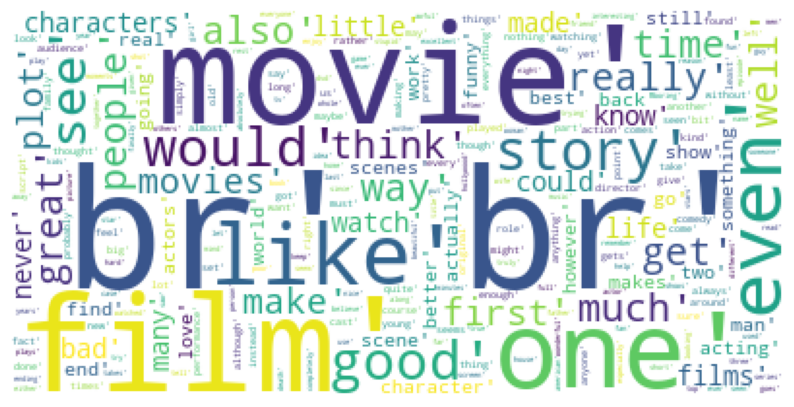

In [27]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [28]:
#COUNT THE NUMBER OF TIMES A WORD HAS REPEATED THROUGHOUT THE DATA
tok_wo_sw=(str(tok_wo_sw))

In [29]:
stopwords= list(stopwords.words('english'))

filtered_words = [word for word in tok_wo_sw.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)

In [30]:
counted_words.most_common(100) 

[("'br',", 8248),
 ("'movie',", 3576),
 ("'film',", 3118),
 ("'one',", 2014),
 ("'like',", 1608),
 ("'good',", 1080),
 ("'even',", 1054),
 ("'see',", 1050),
 ("'would',", 994),
 ("'story',", 924),
 ("'time',", 914),
 ("'really',", 910),
 ("'get',", 830),
 ("'well',", 824),
 ("'much',", 802),
 ("'people',", 728),
 ("'made',", 708),
 ("'first',", 706),
 ("'bad',", 704),
 ("'way',", 696),
 ("'also',", 694),
 ("'great',", 692),
 ("'movies',", 678),
 ("'think',", 628),
 ("'make',", 616),
 ("'plot',", 584),
 ("'watch',", 576),
 ("'many',", 570),
 ("'characters',", 556),
 ("'never',", 550),
 ("'two',", 546),
 ("'little',", 544),
 ("'life',", 542),
 ("'could',", 542),
 ("'character',", 536),
 ("'films',", 530),
 ("'best',", 528),
 ("'seen',", 510),
 ("'know',", 500),
 ("'acting',", 496),
 ("'man',", 482),
 ("'go',", 460),
 ("'show',", 460),
 ("'ever',", 460),
 ("'scene',", 458),
 ("'scenes',", 454),
 ("'love',", 440),
 ("'better',", 438),
 ("'back',", 434),
 ("'still',", 416),
 ("'end',", 414)

<BarContainer object of 10 artists>

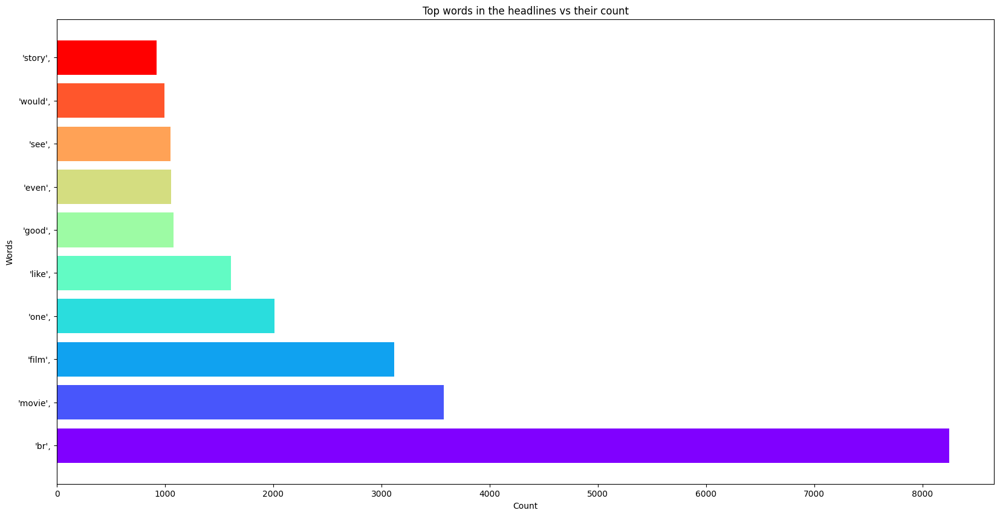

In [31]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headlines vs their count')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

SENTIMENT ANALYSIS

In [32]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sen = tok_wo_sw
tokenized_sentence = nltk.word_tokenize(sen)

sid = SentimentIntensityAnalyzer()
pos_list=[]
neg_list=[]
neu_list=[]

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_list.append(word)
    else:
        neu_list.append(word)

print('Positive:',pos_list)
print('Neutral:',neu_list)
print('Negative:',neg_list)

Positive: ["'trust", "'security", "'agreements", "'pretty", "'charm", "'romance", "'ready", "'well", "'comfortable", "'wonderful", "'comforting", "'well", "'truly", "'well", "'worth", "'great", "'comedy", "'dream", "'solid", "'plays", "'well", "'wonderful", "'comedy", "'well", "'love", "'laughed", "'comedies", "'impressed", "'sexy", "'spirited", "'jewel", "'interesting", "'great", "'comedy", "'friends", "'thriller", "'like", "'thriller", "'well", "'playing", "'love", "'stunning", "'success", "'play", "'sophisticated", "'best", "'sincere", "'good", "'talented", "'alive", "'wish", "'good", "'luck", "'await", "'favorite", "'noble", "'truly", "'sympathetic", "'delight", "'like", "'fun", "'sure", "'like", "'excitement", "'hero", "'adventure", "'thank", "'like", "'nice", "'amazing", "'fresh", "'innovative", "'brilliant", "'funny", "'truly", "'entertaining", "'hand", "'original", "'brilliance", "'fit", "'respect", "'original", "'huge", "'success", "'encouraged", "'positive", "'truly", "'playe

In [33]:
#TOP 100 POSITIVE WORDS
print(list(iter(pos_list[:100])))

["'trust", "'security", "'agreements", "'pretty", "'charm", "'romance", "'ready", "'well", "'comfortable", "'wonderful", "'comforting", "'well", "'truly", "'well", "'worth", "'great", "'comedy", "'dream", "'solid", "'plays", "'well", "'wonderful", "'comedy", "'well", "'love", "'laughed", "'comedies", "'impressed", "'sexy", "'spirited", "'jewel", "'interesting", "'great", "'comedy", "'friends", "'thriller", "'like", "'thriller", "'well", "'playing", "'love", "'stunning", "'success", "'play", "'sophisticated", "'best", "'sincere", "'good", "'talented", "'alive", "'wish", "'good", "'luck", "'await", "'favorite", "'noble", "'truly", "'sympathetic", "'delight", "'like", "'fun", "'sure", "'like", "'excitement", "'hero", "'adventure", "'thank", "'like", "'nice", "'amazing", "'fresh", "'innovative", "'brilliant", "'funny", "'truly", "'entertaining", "'hand", "'original", "'brilliance", "'fit", "'respect", "'original", "'huge", "'success", "'encouraged", "'positive", "'truly", "'played", "'happ

In [34]:
#TOP 100 NEGATIVE WORDS
print(list(iter(neg_list[:100])))

["'struck", "'brutality", "'violence", "'timid", "'violence", "'prison", "'death", "'dodgy", "'forget", "'forget", "'forget", "'mess", "'struck", "'nasty", "'violence", "'violence", "'injustice", "'kill", "'prison", "'bitches", "'lack", "'prison", "'uncomfortable", "'discomforting", "'disappears", "'terribly", "'suspected", "'killer", "'disappointed", "'risk", "'devil", "'fighting", "'kill", "'arguing", "'ruins", "'meaningless", "'ignore", "'loneliness", "'anxiously", "'boring", "'tears", "'doubt", "'waste", "'fallen", "'painfully", "'bad", "'bad", "'hard", "'awful", "'bad", "'mistake", "'worst", "'awful", "'lame", "'nasty", "'boring", "'obsessives", "'hell", "'odd", "'low", "'problem", "'lost", "'helplessly", "'horror", "'horror", "'tired", "'died", "'scary", "'worn", "'cry", "'killing", "'warned", "'cry", "'complained", "'evil", "'mad", "'cry", "'disappointed", "'suck", "'fighting", "'cry", "'annoying", "'shoot", "'lost", "'ruin", "'cut", "'prisoners", "'bad", "'sorrow", "'bizarre", 

In [35]:
# Converting all Polarity scores and sentences into a dataframe.
analyzer = SentimentIntensityAnalyzer()
txtdf['rating'] = Text.apply(analyzer.polarity_scores)
txtdf=pds.concat([txtdf.drop(['rating'], axis=1), txtdf['rating'].apply(pds.Series)], axis=1)

In [36]:
sentences = txtdf

In [37]:
# Giving threshold values to classify if a given sentence is positive, negative or neutral in nature.
i = 0

predicted_value = [ ] #empty series to hold our predicted values

while(i<len(sentences)):
    if ((sentences.iloc[i]['compound'] >= 0.5)):
        predicted_value.append('positive')
        i = i+1
    elif ((sentences.iloc[i]['compound'] > 0) & (sentences.iloc[i]['compound'] < 0.5)):
        predicted_value.append('neutral')
        i = i+1
    elif ((sentences.iloc[i]['compound'] <= 0)):
        predicted_value.append('negative')
        i = i+1

In [38]:
txtdf

,Text,neg,neu,pos,compound
1,One of the other reviewers has mentioned that ...,0.176,0.758,0.066,-0.9907
2,A wonderful little production. The filming tec...,0.053,0.765,0.182,0.9670
3,I thought this was a wonderful way to spend ti...,0.116,0.675,0.210,0.9579
4,Basically theres a family where a little boy (...,0.130,0.808,0.062,-0.9213
5,Petter Matteis Love in the Time of Money is a ...,0.052,0.800,0.148,0.9744
...,...,...,...,...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...,0.063,0.867,0.070,0.4100
997,I hated it. I hate selfaware pretentious inani...,0.234,0.766,0.000,-0.9618
998,I usually try to be professional and construct...,0.193,0.743,0.064,-0.9952
999,If you like me is going to see this in a film ...,0.130,0.748,0.121,-0.7379


In [39]:
predicted_value

['negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'neutral',
 'neutral',
 'positive',
 'positive',
 'positive',
 'positive',
 'neutral',
 'negative',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'neutral',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'neutral',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'neutral',
 'positive',
 'positive',
 'positive',
 'negative',
 'negat

In [40]:
txtdf['Target'] = predicted_value

In [41]:
txtdf.head()

,Text,neg,neu,pos,compound,Target
1,One of the other reviewers has mentioned that ...,0.176,0.758,0.066,-0.9907,negative
2,A wonderful little production. The filming tec...,0.053,0.765,0.182,0.9670,positive
3,I thought this was a wonderful way to spend ti...,0.116,0.675,0.210,0.9579,positive
4,Basically theres a family where a little boy (...,0.130,0.808,0.062,-0.9213,negative
5,Petter Matteis Love in the Time of Money is a ...,0.052,0.800,0.148,0.9744,positive


In [42]:
# Final dataframe
txtdf.drop(['neg','neu','pos','compound'],axis=1,inplace=True)
txtdf

,Text,Target
1,One of the other reviewers has mentioned that ...,negative
2,A wonderful little production. The filming tec...,positive
3,I thought this was a wonderful way to spend ti...,positive
4,Basically theres a family where a little boy (...,negative
5,Petter Matteis Love in the Time of Money is a ...,positive
...,...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...,neutral
997,I hated it. I hate selfaware pretentious inani...,negative
998,I usually try to be professional and construct...,negative
999,If you like me is going to see this in a film ...,negative


In [43]:
txtdf['Target'].value_counts()

positive    577
negative    363
neutral      60
Name: Target, dtype: int64

In [44]:
# Label Encoding the target column.
cat_cols=['Target']
le=LabelEncoder()
for i in cat_cols:
    txtdf[i]=le.fit_transform(txtdf[i])
txtdf.dtypes

Text      object
Target     int32
dtype: object

In [45]:
# Label encoded value_counts()
txtdf['Target'].value_counts()

2    577
0    363
1     60
Name: Target, dtype: int64

In [46]:
txtdf

,Text,Target
1,One of the other reviewers has mentioned that ...,0
2,A wonderful little production. The filming tec...,2
3,I thought this was a wonderful way to spend ti...,2
4,Basically theres a family where a little boy (...,0
5,Petter Matteis Love in the Time of Money is a ...,2
...,...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...,1
997,I hated it. I hate selfaware pretentious inani...,0
998,I usually try to be professional and construct...,0
999,If you like me is going to see this in a film ...,0


In [47]:
# Vectorizing training data.
# Applying Tf-Idf vectorizer on the Text column.
tfidf = TfidfVectorizer()
X = tfidf.fit_transform(txtdf['Text'])
Y = txtdf['Target']

In [48]:
# Splitting the dataset.
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=40)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)

(800, 19123) (200, 19123) (800,) (200,)


DECISION TREE CLASSIFIER

In [49]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
DT = DecisionTreeClassifier().fit(X,Y)

In [50]:

y_pred = DT.predict(X_train)
print("Model accuracy on train is: ", accuracy_score(Y_train, y_pred))

#predict on test
y_testpred = DT.predict(X_test)
print("Model accuracy on test is: ", accuracy_score(Y_test, y_testpred))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, y_pred))
print("confusion_matrix test is: ", confusion_matrix(Y_test, y_testpred))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=y_testpred).sum(),'/',((Y_test == y_testpred).sum()+(Y_test != y_testpred).sum()))
print('-'*50)

# Kappa Score
print('KappaScore is: ', metrics.cohen_kappa_score(Y_test,y_testpred))

Model accuracy on train is:  1.0
Model accuracy on test is:  1.0
--------------------------------------------------
confusion_matrix train is:  [[283   0   0]
 [  0  47   0]
 [  0   0 470]]
confusion_matrix test is:  [[ 80   0   0]
 [  0  13   0]
 [  0   0 107]]
Wrong predictions out of total
--------------------------------------------------
0 / 200
--------------------------------------------------
KappaScore is:  1.0
